In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *
import lpips

In [2]:
def get_sobel_kernel_x(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = x
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

def get_sobel_kernel_y(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = y
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

In [12]:
model_amp = UNet(num_input_channels=1, num_output_channels=1) # postprocessor
model_phase = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -13.53], [-113.3250], [ -12.7425], [   4.4154], [   6.2158], 
                       [ -119.261], [   2.3329], [  1.3617], [   1.5364], [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(155.003, requires_grad=True) # mm 

loss_fn_alex = lpips.LPIPS(net='alex') 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1},
    {'params': cons, 'lr': 1e-2}
    # {'params': dist, 'lr': 1}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model_amp.parameters(), 'lr': 2e-2},
    {'params': model_phase.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/kazim/anaconda3/envs/Phase_Unwrap_DIP/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/kazim/anaconda3/envs/Phase_Unwrap_DIP/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/kazim/anaconda3/envs/Phase_Unwrap_DIP/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth


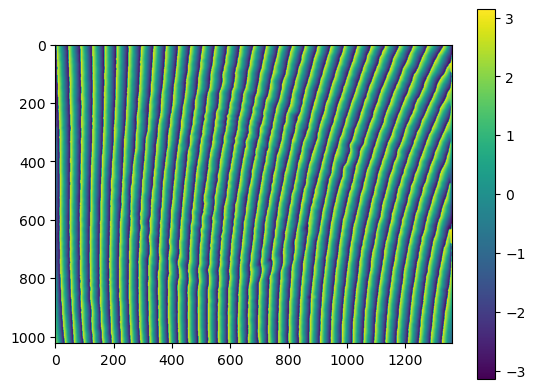

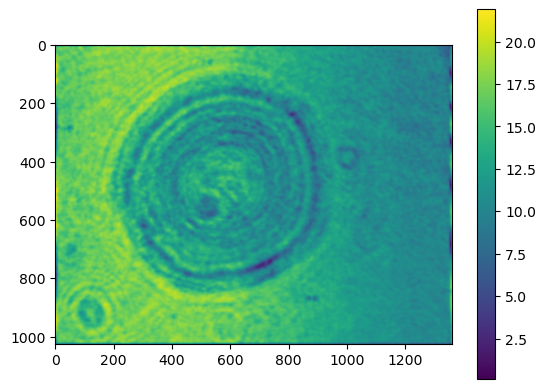

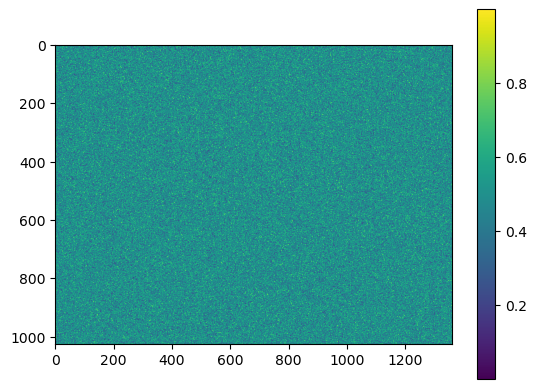

In [13]:
plt.imshow(target_phase.T)
plt.colorbar()
plt.show()

plt.imshow(target_abs.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

0 0.3870994236045222 155.0030059814453


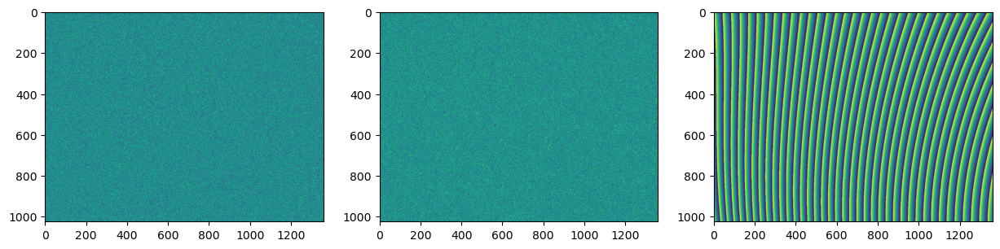

1 0.354240473921744 155.0030059814453
2 0.33575707782340464 155.0030059814453
3 0.3274097405119645 155.0030059814453
4 0.3253052583590341 155.0030059814453
5 0.3262574208344427 155.0030059814453
6 0.32799355632175986 155.0030059814453
7 0.32922176029674033 155.0030059814453
8 0.32947115333366594 155.0030059814453
9 0.3287937732715571 155.0030059814453
10 0.327506591268392 155.0030059814453


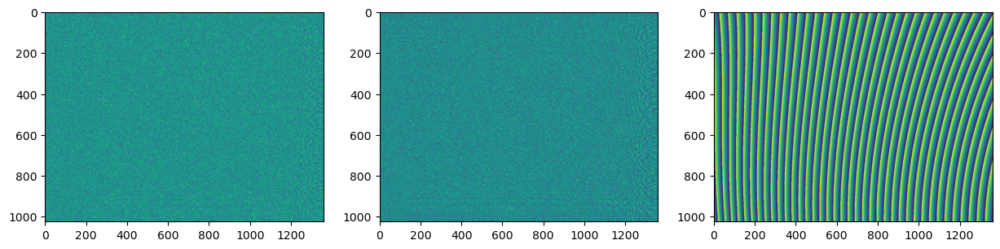

11 0.325975472518347 155.0030059814453
12 0.3245020827357936 155.0030059814453
13 0.3232794311769722 155.0030059814453
14 0.32238705571295045 155.0030059814453
15 0.32181662145413037 155.0030059814453
16 0.3215004960890859 155.0030059814453
17 0.3213477425843577 155.0030059814453
18 0.3212667673053708 155.0030059814453
19 0.32118374925164145 155.0030059814453
20 0.32105526668630746 155.0030059814453


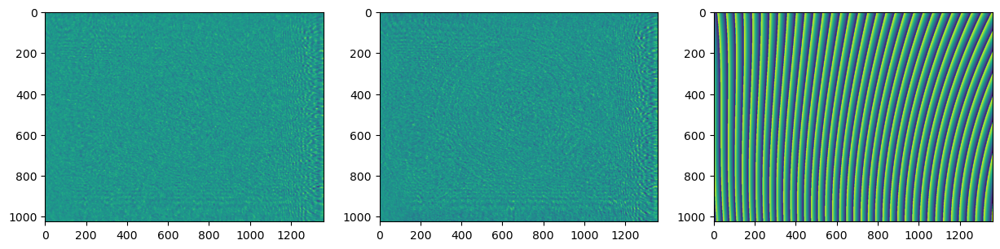

21 0.32086619289372653 155.0030059814453
22 0.32062435734431327 155.0030059814453
23 0.32035429799854187 155.0030059814453
24 0.32008252319102815 155.0030059814453
25 0.31983109331402904 155.0030059814453
26 0.31961596062335335 155.0030059814453
27 0.3194435218029577 155.0030059814453
28 0.3193095281495238 155.0030059814453
29 0.3192067974867681 155.0030059814453
30 0.3191229846916999 155.0030059814453


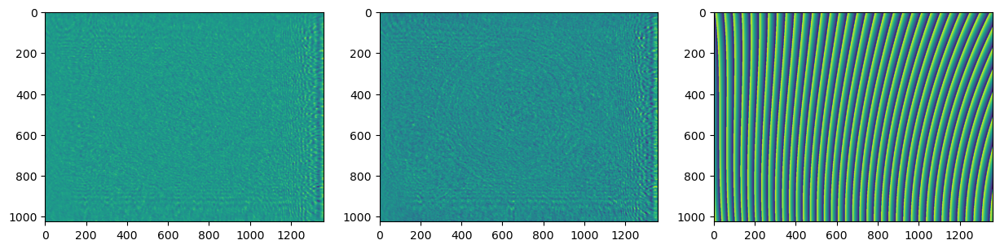

31 0.31905015101079814 155.0030059814453
32 0.31897780267447184 155.0030059814453
33 0.31890239263690323 155.0030059814453
34 0.3188232543433416 155.0030059814453
35 0.31874528255281576 155.0030059814453
36 0.3186688266694134 155.0030059814453
37 0.3185974076446215 155.0030059814453
38 0.31853376605394473 155.0030059814453
39 0.3184790413724736 155.0030059814453
40 0.31843150447634605 155.0030059814453


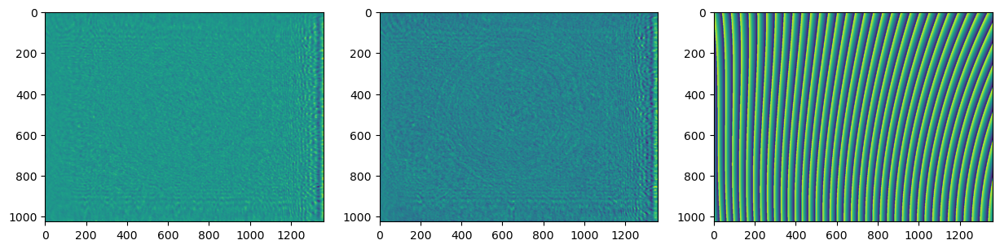

41 0.31838901481203774 155.0030059814453
42 0.318353251527404 155.0030059814453
43 0.3183192001624452 155.0030059814453
44 0.3182878400382937 155.0030059814453
45 0.31825883178721404 155.0030059814453
46 0.3182303148724548 155.0030059814453
47 0.31820393353183807 155.0030059814453
48 0.31818070058427816 155.0030059814453
49 0.318157829295054 155.0030059814453
50 0.3181373464337288 155.0030059814453


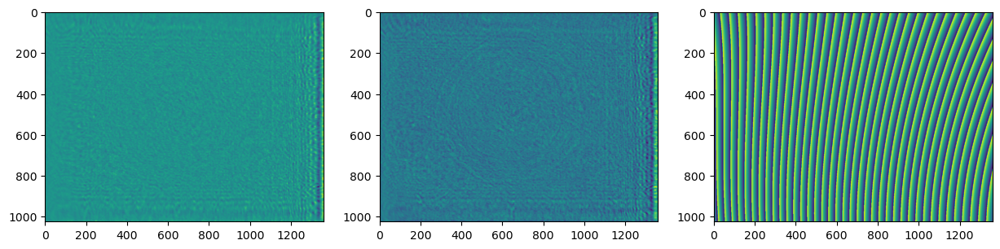

51 0.3181214407532844 155.0030059814453
52 0.3181044717191255 155.0030059814453
53 0.31809077451988066 155.0030059814453
54 0.3180782769981667 155.0030059814453
55 0.31806655682822604 155.0030059814453
56 0.318057881264468 155.0030059814453
57 0.3180479572093322 155.0030059814453
58 0.31804123286401537 155.0030059814453
59 0.31803302738559874 155.0030059814453
60 0.31802730671956636 155.0030059814453


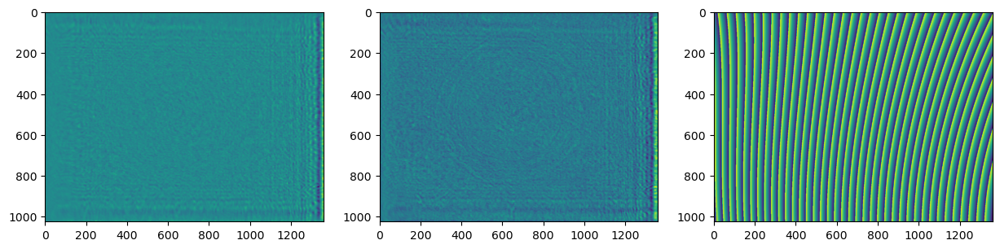

61 0.31802049586761777 155.0030059814453
62 0.31801387094179334 155.0030059814453
63 0.318008027469432 155.0030059814453
64 0.31800236702069673 155.0030059814453
65 0.31799836886739047 155.0030059814453
66 0.3179945026325596 155.0030059814453
67 0.317990892123316 155.0030059814453
68 0.3179877840163947 155.0030059814453
69 0.3179868991324104 155.0030059814453
70 0.31798330351890414 155.0030059814453


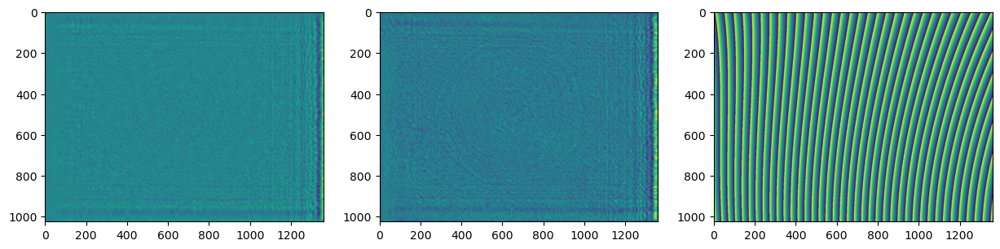

71 0.31797934613668244 155.0030059814453
72 0.3179776050065747 155.0030059814453
73 0.3179745639841899 155.0030059814453
74 0.31797101226762736 155.0030059814453
75 0.3179699466835973 155.0030059814453


KeyboardInterrupt: 

In [14]:
epochs = 101
loss_arr = []


for itr in range(epochs):

    optimizer.zero_grad()
    optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)

    wave_z_amp = torch.abs(wave_at_img).float()
    wave_z_phase = torch.angle(wave_at_img).float() + cons

    wave_z_amp_proc = model_amp(wave_z_amp.unsqueeze(0).unsqueeze(0)).squeeze()
    wave_z_phase_proc = model_amp(wave_z_phase.unsqueeze(0).unsqueeze(0)).squeeze()

    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)
    
    loss_amp = loss_fn(wave_z_amp_proc, target_abs)
    loss_phase = loss_fn(wave_z_phase_proc, target_phase)
    # loss_amp = l2_loss(torch.abs(wave_at_img).float(), target_abs.float())

    loss = 1.0*(loss_amp + loss_phase) + total_variation_loss(obj_phase, 0.1) + total_variation_loss(obj_amp, 0.1) + 0.1*l2_loss(wave_z_amp, wave_z_amp_proc) + 0.1*l2_loss(wave_z_phase, wave_z_phase_proc)
    # + 1/(grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean())

    # 

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1], dist.item(), 
        #   (grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean()).abs().item()
          ) 

    if (itr) % 10 == 0:

        fig, axs = plt.subplots(1, 3, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.detach())
        axs[2].imshow(torch.angle(wave.detach()))

        plt.show()

In [15]:
dist, dist.grad, cons.grad, coeffs.grad, coeffs

(tensor(155.0030),
 None,
 tensor(6.1609e-05),
 tensor([[-3.0636e-05],
         [-2.0035e-06],
         [-4.0027e-06],
         [ 5.3502e-06],
         [ 2.9303e-06],
         [ 6.1610e-05],
         [-2.2012e-05],
         [-1.7115e-06],
         [-9.6100e-06],
         [-9.7818e-07]]),
 tensor([[ -13.6549],
         [-113.8291],
         [ -12.6690],
         [   2.6220],
         [   3.5425],
         [-126.7134],
         [   2.4341],
         [   2.0854],
         [   1.4879],
         [   4.0751]], requires_grad=True))

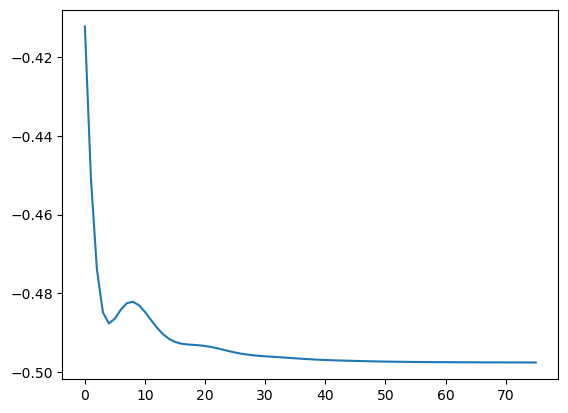

In [16]:
plt.plot(np.log10(loss_arr))

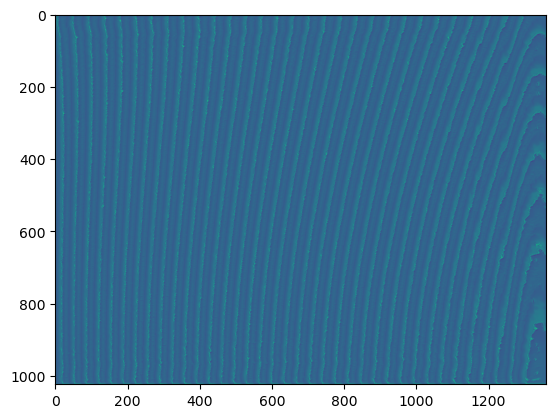

In [19]:
plt.imshow(wave_z_phase_proc.detach().T)

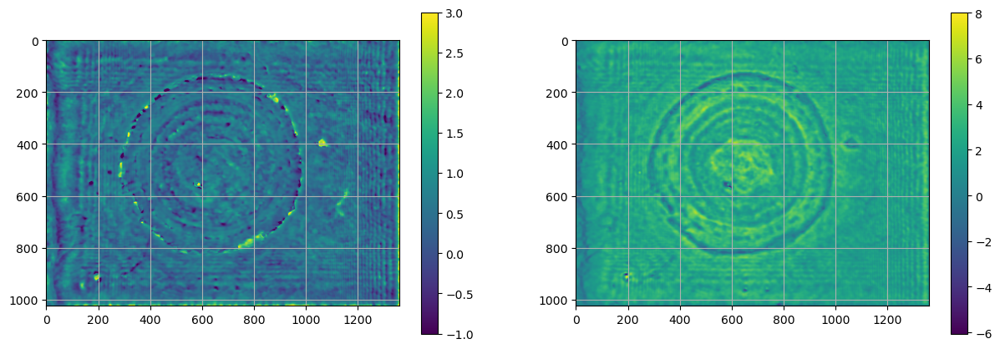

In [141]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

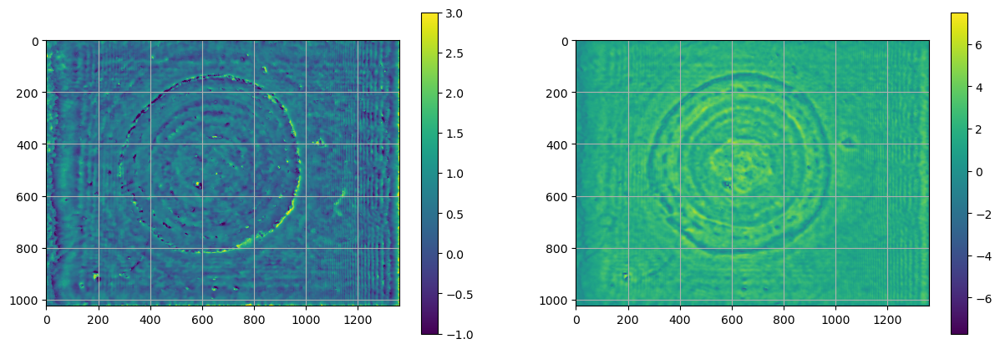

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

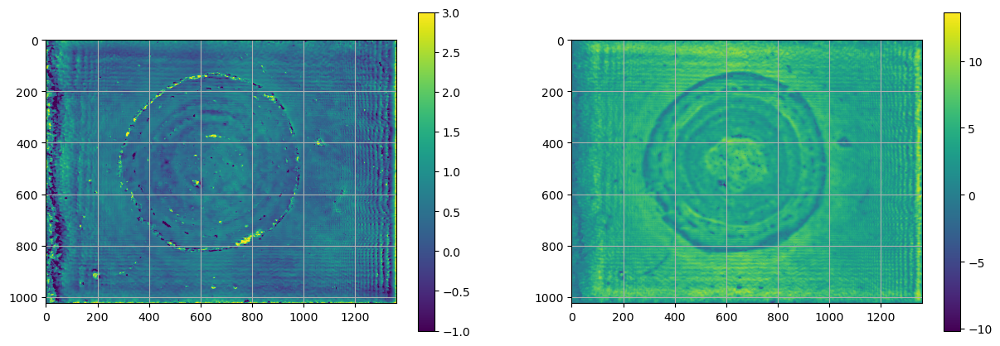

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

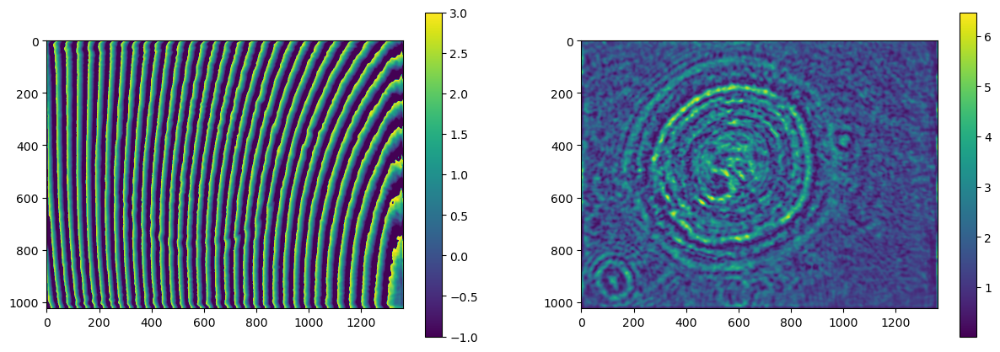

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

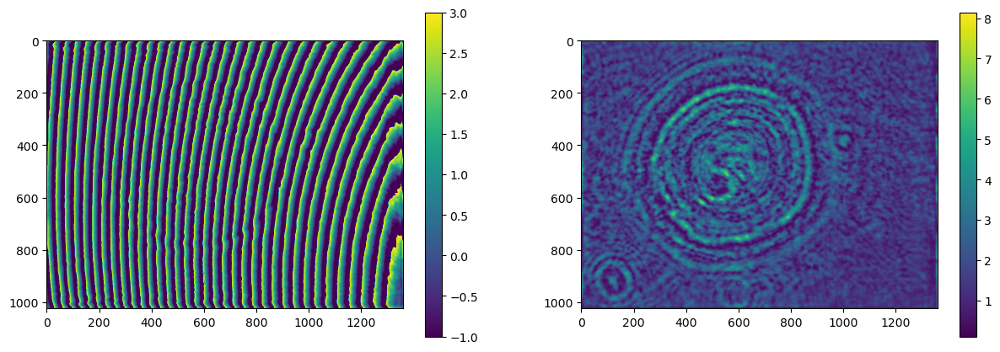

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

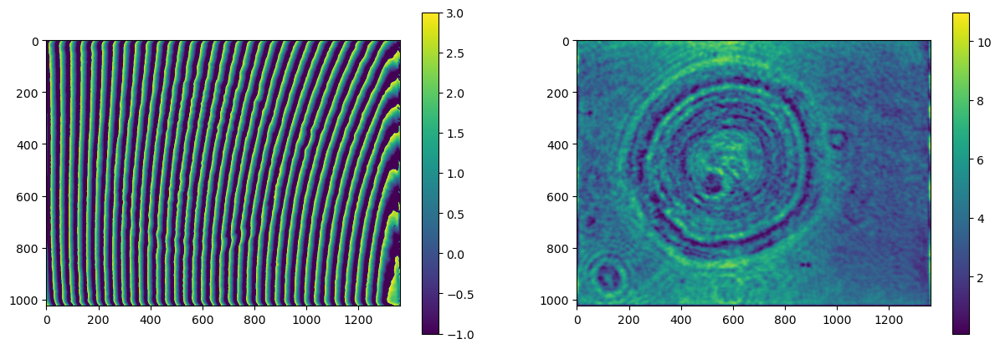

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

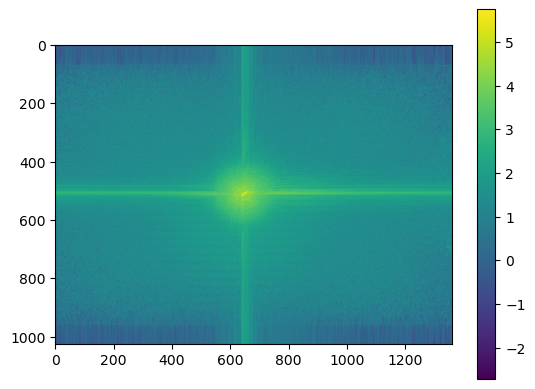

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

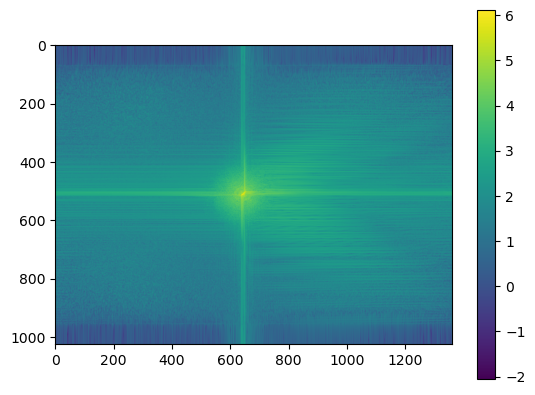

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

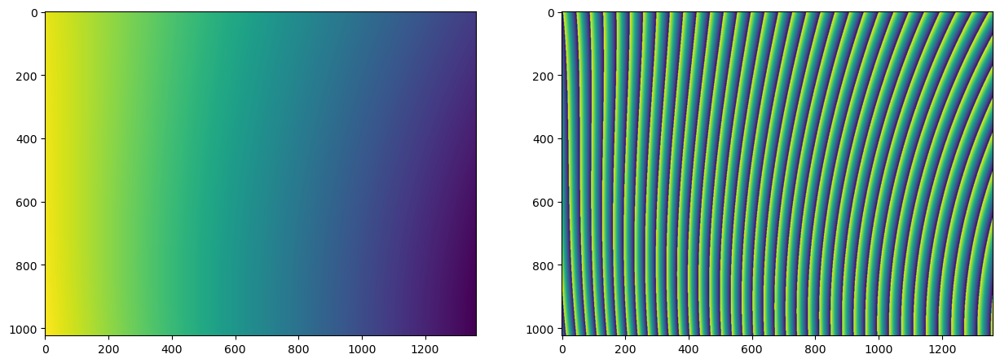

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

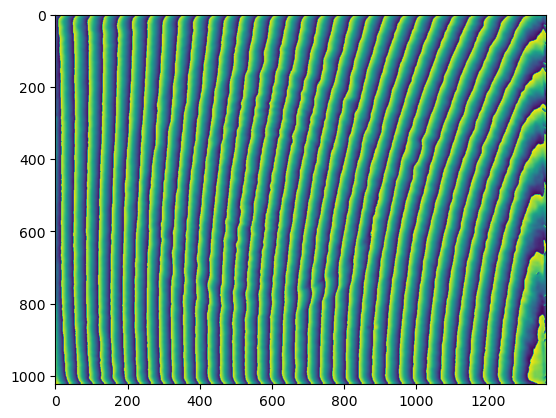

In [ ]:
plt.imshow(wave_z.detach().T)

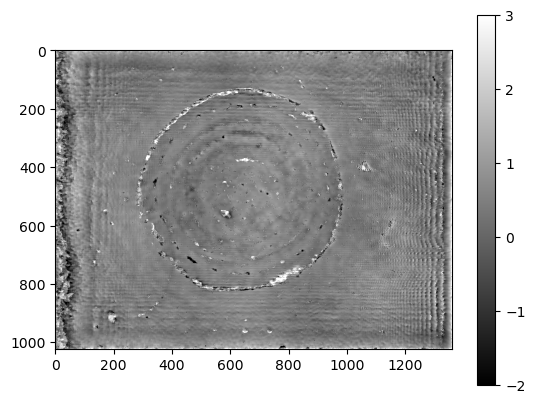

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()